Total gambar: 90


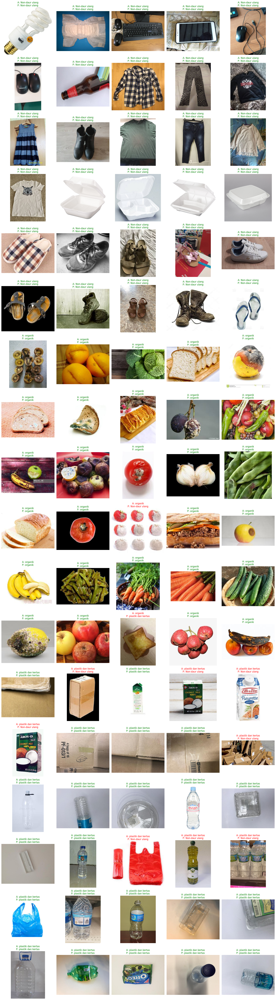

In [3]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import math

# =============================
# KONFIGURASI
# =============================
MODEL_PATH = "D:/skripsi/wastecategorized13.tflite"
TEST_DIR = "D:/skripsi/test"
IMG_SIZE = 224

CLASS_NAMES = sorted(os.listdir(TEST_DIR))

# =============================
# LOAD MODEL
# =============================
interpreter = tf.lite.Interpreter(model_path=MODEL_PATH)
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# =============================
# PREPROCESS
# =============================
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img.astype(np.float32) / 255.0
    img = np.expand_dims(img, axis=0)
    return img

# =============================
# KUMPULKAN SEMUA GAMBAR
# =============================
all_images = []

for class_name in CLASS_NAMES:
    class_folder = os.path.join(TEST_DIR, class_name)
    for file in os.listdir(class_folder):
        img_path = os.path.join(class_folder, file)
        all_images.append((img_path, class_name))

total_images = len(all_images)
print("Total gambar:", total_images)

# =============================
# TENTUKAN GRID DINAMIS
# =============================
cols = 5
rows = math.ceil(total_images / cols)

plt.figure(figsize=(20, rows * 4))

# =============================
# LOOP SEMUA GAMBAR
# =============================
for index, (img_path, actual_class) in enumerate(all_images, start=1):

    input_data = preprocess_image(img_path)

    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()

    output_data = interpreter.get_tensor(output_details[0]['index'])
    pred_index = np.argmax(output_data)
    pred_class = CLASS_NAMES[pred_index]

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    color = "green" if pred_class == actual_class else "red"

    plt.subplot(rows, cols, index)
    plt.imshow(img)
    plt.title(f"A: {actual_class}\nP: {pred_class}", color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()
